# <div style='padding:25px;background-color:maroon;color:white;border-radius:4px;font-size:100%;text-align: center'>Banking Data Analysis<br></div>

## <span style="color:Aqua;">Importing libraries from Python</span>

In [11]:
import pandas as pd
pd.options.display.max_columns = 50
pd.set_option("display.precision", 4)
pd.set_option('display.float_format', '{:.4f}'.format)


import numpy as np
import math
from scipy.stats import pearsonr,kstest, norm, skew,kurtosis, boxcox
from statsmodels.formula.api import ols
import statsmodels.api as sm
import scipy.stats as stats

import seaborn as sns
sns.set_theme(context='notebook', style='white', palette='dark', font='sans-serif', font_scale=1, color_codes=True, rc=None)
sns.set_style({'axes.facecolor': 'white','axes.edgecolor': 'white'})

import matplotlib.pyplot as plt
plt.rcParams.update({
    'text.color': 'black',  # Change font color
    'axes.labelcolor': 'black',  # Change axis label color
    'xtick.color': 'black',  # Change x-tick color
    'ytick.color': 'black',  # Change y-tick color
    'font.weight': 'bold',  # Change font weight
    'axes.titleweight': 'bold',  # Change title weight
    'axes.labelweight': 'bold',# Change label weight
})


color_good = '\033[32m'   # Dark Green for near-zero skew
color_okay = '\033[92m'   # Light Green for slightly positive or slightly negative skew
color_bad = '\033[91m'    # Maroon for significant skew
color_neutral = '\033[0m' # Reset color

### <span style="color:Khaki;">Reading cleaned Dataset:

In [12]:
df=pd.read_feather('Cleaned_data')

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 35 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   id                        100000 non-null  int64  
 1   customer_id               100000 non-null  int64  
 2   month                     100000 non-null  int8   
 3   name                      100000 non-null  object 
 4   age                       100000 non-null  int8   
 5   ssn                       100000 non-null  float64
 6   occupation                100000 non-null  object 
 7   annual_income             100000 non-null  float64
 8   monthly_inhand_salary     100000 non-null  float64
 9   num_bank_accounts         100000 non-null  int8   
 10  num_credit_card           100000 non-null  int8   
 11  interest_rate             100000 non-null  int8   
 12  num_of_loan               100000 non-null  int8   
 13  delay_from_due_date       100000 non-null  in

In [14]:
df.sample(3)

,id,customer_id,month,name,age,ssn,occupation,annual_income,monthly_inhand_salary,num_bank_accounts,num_credit_card,interest_rate,num_of_loan,delay_from_due_date,num_of_delayed_payment,changed_credit_limit,num_credit_inquiries,credit_mix,outstanding_debt,credit_utilization_ratio,credit_history_age,payment_of_min_amount,total_emi_per_month,amount_invested_monthly,payment_behaviour,monthly_balance,credit_score,Auto Loan,Credit-Builder Loan,Debt Consolidation Loan,Payday Loan,Home Equity Loan,Personal Loan,Mortgage Loan,Student Loan
81804,128338,1355,5,Evaa,31,468640497.0000,Architect,55209.8100,4303.8175,5,3,23,7,28,12,15,6.0000,Standard,1922.8200,28,171,Yes,231.9278,61.4790,High_Spent_Large_Value_Payments,376.9750,Standard,1,1,0,1,0,0,1,0
63668,101134,25750,5,Mark Felsenthalf,18,293535614.0000,Journalist,33127.3100,2484.6092,4,4,10,4,12,17,9,7.0000,Standard,37.2100,31,393,Nm,106.8187,47.5094,High_Spent_Large_Value_Payments,321.5126,Good,0,0,0,1,0,1,1,1
14229,26975,19717,6,Hepherh,31,942078132.0000,Journalist,147996.7200,12395.0600,2,4,6,3,5,9,2,2.0000,Good,248.1600,40,284,No,197.1330,175.3358,High_Spent_Large_Value_Payments,989.1817,Good,0,0,0,0,0,1,1,0


---
title: "Feature Engineering"
author: "Santhoh Kumar"
format:
  html:
    toc: true
    html-math-method: katex
    css: styles.css
---


## <span style="color:Aqua;">Feature Engineering:</span>

<span style="color: Chartreuse;"> &nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9784; </span> In this section we are gonna create new features  (columns/Variables) using the existing features. Example - Annual income divided by 12 will become monthly income. These features provide additional insights and improve our model metrics/prediction.


### <span style="color:Khaki;">Creating New Features:

In [15]:
df['debt_income_ratio'] = df.annual_income / (df.num_of_loan + df.num_credit_card + np.spacing(1)) # Adding np.spacing(1) to avoid division by zero errorr
df['loan_income_ratio_month'] = (df.monthly_inhand_salary) / (df.total_emi_per_month + np.spacing(1)) 
df['credit_utilization_per_account'] = df.credit_utilization_ratio / (df.num_bank_accounts + np.spacing(1))
df['credit_inquiry_per_loan'] = np.ceil((df.num_credit_inquiries) / (df.num_of_loan + np.spacing(1)))
df['age_group'] = pd.cut(df.age, bins=[0, 18, 25, 35, 50, 100], labels=['<18', '18-25', '26-35', '36-50', '50+'])
df['delayed_payment_ratio'] = df.num_of_delayed_payment / (df.num_of_loan + np.spacing(1)).astype('int8')
df['investment_to_income_ratio'] = (df.amount_invested_monthly ) / (df.monthly_inhand_salary + np.spacing(1))  # Adding np.spacing(1) to avoid division by zero
df['credit_limit_change_rate'] = df.changed_credit_limit / (df.credit_history_age + np.spacing(1))
df['payment_behavior_category'] = df.payment_behaviour.apply(lambda x: 'Good' if x in ['Pays On Time', 'Early Payment'] else 'Bad')
df['total_credit_exposure'] = df.outstanding_debt + df.credit_utilization_ratio
df['credit_utilization_to_income_ratio'] = df.credit_utilization_ratio / df.annual_income
df['savings_rate'] = df.amount_invested_monthly / df.monthly_inhand_salary
df['reliable_payment'] = (df.num_of_delayed_payment / df.credit_history_age) * 100
df['income_stability'] = df.monthly_inhand_salary / (df.annual_income / 12)
df['total_liability'] = df.total_emi_per_month + df.outstanding_debt
df['debt_paytime'] = df.outstanding_debt / (df.total_emi_per_month + np.spacing(1))


### <span style="color:Khaki;">Dropping unecessary Features:

In [16]:
df.drop(['id','customer_id','ssn','month','name'],axis=1,inplace=True)

In [17]:
df.changed_credit_limit.min()

0

In [18]:
df.sample(3)

,age,occupation,annual_income,monthly_inhand_salary,num_bank_accounts,num_credit_card,interest_rate,num_of_loan,delay_from_due_date,num_of_delayed_payment,changed_credit_limit,num_credit_inquiries,credit_mix,outstanding_debt,credit_utilization_ratio,credit_history_age,payment_of_min_amount,total_emi_per_month,amount_invested_monthly,payment_behaviour,monthly_balance,credit_score,Auto Loan,Credit-Builder Loan,Debt Consolidation Loan,Payday Loan,Home Equity Loan,Personal Loan,Mortgage Loan,Student Loan,debt_income_ratio,loan_income_ratio_month,credit_utilization_per_account,credit_inquiry_per_loan,age_group,delayed_payment_ratio,investment_to_income_ratio,credit_limit_change_rate,payment_behavior_category,total_credit_exposure,credit_utilization_to_income_ratio,savings_rate,reliable_payment,income_stability,total_liability,debt_paytime
69333,42,Doctor,69712.2000,5841.3500,8,7,5,5,25,19,16,6.0000,Standard,1638.9400,24,174,Yes,275.1259,73.1771,High_Spent_Small_Value_Payments,267.7720,Standard,1,0,0,0,0,1,0,0,5809.3500,21.2316,3.0000,2.0000,36-50,3.8000,0.0125,0.0920,Bad,1662.9400,0.0003,0.0125,10.9195,1.0055,1914.0659,5.9571
87879,38,Accountant,12768.9400,1079.0783,8,5,15,1,12,8,10,4.0000,Standard,487.1700,39,401,Yes,5.3511,24.0194,Low_Spent_Medium_Value_Payments,298.6600,Good,0,0,0,0,0,0,0,1,2128.1567,201.6559,4.8750,4.0000,36-50,8.0000,0.0223,0.0249,Bad,526.1700,0.0031,0.0223,1.9950,1.0141,492.5211,91.0413
18832,21,Lawyer,126115.5600,10304.6300,8,7,19,4,15,14,9,3.0000,Standard,1208.2900,29,344,Nm,389.0075,70.7864,High_Spent_Small_Value_Payments,596.7392,Standard,0,0,1,0,1,0,0,1,11465.0509,26.4895,3.6250,1.0000,18-25,3.5000,0.0069,0.0262,Bad,1237.2900,0.0002,0.0069,4.0698,0.9805,1597.2975,3.1061


## <span style="color:Aqua;">Defining variable type:

<span style="color: Chartreuse;"> &nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9784; </span> On a high level we can categorize data into two types <span style="color: Chartreuse;"> Continuous and Categorial </span> In this section we are gonna split features based on the nature of it's type.<br>



   <span style="color: Chartreuse;font-size:130%;"> &nbsp; &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &nbsp;&#9830; </span> Continuous variables can take any value within a range and can habe infinite possible values. 
      <p> &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &nbsp;Example - `annual_income`, `age`, `Num of bank accounts`, etc. </p>

   <span style="color: Chartreuse;font-size:130%;"> &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&#9830; </span> Continuous Categorial variables have categories with specific order or ranking or represent categories without any inherent or order or ranking. 
      <p> &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &nbsp;- Example - `credit_mix`,`name`, etc.</p>

In [19]:
continuous = ['age','annual_income', 'monthly_inhand_salary','outstanding_debt','credit_utilization_ratio',
              'credit_history_age','total_emi_per_month','amount_invested_monthly','monthly_balance',
              'debt_income_ratio','loan_income_ratio_month', 'interest_rate','credit_utilization_per_account',
              'delayed_payment_ratio','investment_to_income_ratio',
              'credit_limit_change_rate','total_credit_exposure','credit_utilization_to_income_ratio',
              'savings_rate','income_stability','total_liability','debt_paytime','reliable_payment']

categorical = ['occupation','num_bank_accounts' ,'num_credit_card', 'num_of_loan','delay_from_due_date',
               'num_of_delayed_payment','changed_credit_limit','num_credit_inquiries','credit_mix','payment_of_min_amount',
               'payment_behaviour','credit_score','credit_inquiry_per_loan','age_group','payment_behavior_category',]

In [20]:
print(len(continuous) ,'+',  len(categorical),len(continuous) + len(categorical))
print(df.shape[1] - 8) # removing 8 binary columns

23 + 15 38
38


## <p style="color:Aqua;"> Exploratory Data Analysis. Before Handling Skewness, Kurtosis and Outliers</p>

### <p style="color:Khaki;">Before we move further it's crucial to understand the importance of handling <span style="color: Chartreuse;"> Outliers, Normality, Skewness, and Kurtosis </span> and their impact on the ML model performance.

#### <span style="color: Tomato;font-size:130%;"><u> Outliers</u>:- </span> 
Outliers are data points that are significantly different from most other data points in a variable (column). Example, most people in a dataset have an annual income between $20,000 and $100,000, but one person has an income of $1,000,000, that person is an outlier.

<span style="color: Chartreuse;font-size:120%;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&#9830; </span> <span style="color: Tomato;font-size:110%;"> Example:- </span> Most people in a dataset have an annual income between $20,000 and $100,000, but one person has an income of $1,000,000, that person is an outlier.

<span style="color: Chartreuse;font-size:120%;"> &nbsp; &nbsp;&nbsp;&nbsp;&#9830; </span> <span style="color: Tomato;font-size:110%;"> Impact on Model:- </span> Outliers can skew the results of our analysis and make our model less accurate. For example, if we're predicting loan approval, an outlier income might distort the overall understanding of what typical incomes look like, leading to poor predictions.

#### <span style="color: Tomato;font-size:130%;"> <u>Normality</u>:- 
</span>Normality refers to how data is distributed. In a "normal" distribution, data is symmetrically distributed around the mean (average), forming a bell-shaped curve when we plot a line chart.

<span style="color: Chartreuse;font-size:120%;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&#9830; </span> <span style="color: Tomato;font-size:110%;"> Example:- </span> Imagine measuring the height of adults in a city. Most people would fall around the average height, with fewer people being extremely short or extremely tall, forming a bell curve.

<span style="color: Chartreuse;font-size:120%;"> &nbsp; &nbsp;&nbsp;&nbsp;&#9830; </span> <span style="color: Tomato;font-size:110%;"> Impact on Model:- </span> Many statistical models assume that the data follows a normal distribution. If our data is not normally distributed, the model might not perform as well, leading to inaccurate predictions.

#### <span style="color: Tomato;font-size:130%;"> <u>Skewness</u>:- 
</span>Skewness measures the asymmetry of the data distribution. If data is skewed, it means that it is not evenly distributed around the mean.

<span style="color: Chartreuse;font-size:120%;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&#9830; </span> <span style="color: Tomato;font-size:110%;"> <u>Types of Skewness</u>:- </span><br>

<span style="color: Chartreuse;font-size:120%;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&#9824; </span><span style="color: Tomato;font-size:100%;"> Positive Skew (Right Skew):- </span> Most data points are clustered on the left with a few high values stretching out to the right.<br>

<span style="color: Chartreuse;font-size:120%;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&#9824; </span><span style="color: Tomato;font-size:100%;"> Negative Skew (Left Skew):- </span> Most data points are clustered on the right with a few low values stretching out to the left.

<span style="color: Chartreuse;font-size:120%;"> &nbsp; &nbsp;&nbsp;&nbsp;&#9830; </span> <span style="color: Tomato;font-size:110%;"> Impact on Model:- </span> Skewed data can affect the performance of our model by giving more weight to the tail-end values, which might not be representative of the majority of our data.

#### <span style="color: Tomato;font-size:130%;"> <u>Kurtosis</u>:- 
</span>Kurtosis measures the "tailedness" of the data distribution. It tells us how much data is in the tails and the peak compared to a normal distribution.

<span style="color: Chartreuse;font-size:120%;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&#9830; </span> <span style="color: Tomato;font-size:110%;"> <u>Types of Kurtosis</u>:- </span><br>

<span style="color: Chartreuse;font-size:120%;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&#9824; </span><span style="color: Tomato;font-size:100%;"> High Kurtosis:- </span> Data has heavy tails and a sharp peak, indicating more extreme values.<br>

<span style="color: Chartreuse;font-size:120%;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&#9824; </span><span style="color: Tomato;font-size:100%;"> Low Kurtosis:- </span> Data has light tails and a flatter peak, indicating fewer extreme values.

<span style="color: Chartreuse;font-size:120%;"> &nbsp; &nbsp;&nbsp;&nbsp;&#9830; </span> <span style="color: Tomato;font-size:110%;"> Impact on Model:- </span> High kurtosis can indicate the presence of outliers, which can affect the accuracy of our model. If the data has more extreme values than expected, our model might overestimate the variability and lead to poor predictions.

<span style="color: Chartreuse;">   &#9784; &nbsp; <span style="color: white;font-size: 120%"> Defining a function to create plots.</span></span><br>

In [21]:
def univar_num(df, col):
    plt.figure(figsize=(16, 8))
    df = df.dropna(subset=[col])


    mean=df[col].mean()
    median=df[col].median()
    mode=df[col].mode()[0]
    sns.set_style({'axes.facecolor': 'white','axes.edgecolor': 'white'})
    plt.subplot(2, 3, 1)
    sns.histplot(data=df, x=col, kde=True, bins=50,color='maroon',fill=True)
    plt.title(f'Histogram for {col}',fontdict={'fontsize':24,'color':'black','fontweight':'bold'})
    plt.axvline(mean, color='maroon', label='Mean')
    plt.axvline(median, color='black', label='Median')
    plt.axvline(mode, color='darkgreen', label='Mode')
    sns.set_theme(context='notebook', style='white', palette='dark', font='sans-serif', font_scale=1, color_codes=True, rc=None)

    
    plt.legend()
    plt.tight_layout()
    
    plt.subplot(2, 3, 2)
    sns.boxplot(data=df, x=col, color='lightgrey',legend=True)
    plt.xticks(rotation=45)
    plt.title(f'Box Plot for {col}',fontdict={'fontsize':24,'color':'black','fontweight':'bold'})
    plt.axvline(mean, color='maroon', label='Mean')
    plt.axvline(median, color='black', label='Median')
    plt.axvline(mode, color='darkgreen', label='Mode')
    plt.legend()
    plt.tight_layout()

    
    plt.subplot(2, 3, 3)
    stats.probplot(df[col], dist="norm", plot=plt)
    plt.gca().get_lines()[1].set_color('maroon')
    plt.gca().get_lines()[0].set_color('darkgreen')
    plt.title(f'QQ Plot for {col}',fontdict={'fontsize':24,'color':'black','fontweight':'bold'})

    plt.tight_layout()
    
    plt.tight_layout()
    plt.show()

<span style="color: Chartreuse;">   &#9784; &nbsp; <span style="color: white;font-size: 120%"> Defining a function to show Kurtosis and Skewness value.</span></span><br>

In [22]:
def kurtosis_color(kurt_val):
    if -1 <= kurt_val <= 1:
        kurt_color = color_good  # Dark Green for near-zero kurtosis (good)
    elif 1 < kurt_val <= 3 or -3 <= kurt_val < -1:
        kurt_color = color_okay  # Yellow for moderate kurtosis
    else:  # kurt_val > 3 or kurt_val < -3
        kurt_color = color_bad  # Maroon for extreme kurtosis
    return kurt_color

def skewness_color(skew_val):
    if -0.5 <= skew_val <= 0.5:
        color = color_good  # Dark Green for near-zero skew
    elif 0 < skew_val <= 0.5 or -0.5 < skew_val < 0:
        color = color_okay  # Light Green for slightly positive or slightly negative skew
    else:  # skew_val > 0.5 or skew_val < -0.5
        color = color_bad  # Maroon for significant skew
    return color

### <span style="color:Khaki;"> Descrptive Statistics:

In [23]:
df.describe().T

/home/san/mnt/F/Technology/Python Project/Capstone/Banking_Analytics/banking/lib/python3.12/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


,count,mean,std,min,25%,50%,75%,max
age,100000.0000,33.3163,10.7648,14.0000,24.0000,33.0000,42.0000,56.0000
annual_income,100000.0000,50505.1234,38299.4221,7005.9300,19342.9725,36999.7050,71683.4700,179987.2800
monthly_inhand_salary,100000.0000,4197.2708,3186.4325,303.6454,1626.5942,3095.9050,5957.7150,15204.6333
num_bank_accounts,100000.0000,5.3688,2.5933,0.0000,3.0000,5.0000,7.0000,11.0000
num_credit_card,100000.0000,5.5336,2.0671,0.0000,4.0000,5.0000,7.0000,11.0000
interest_rate,100000.0000,14.5321,8.7413,1.0000,7.0000,13.0000,20.0000,34.0000
num_of_loan,100000.0000,3.5329,2.4464,0.0000,2.0000,3.0000,5.0000,9.0000
delay_from_due_date,100000.0000,21.0814,14.8046,0.0000,10.0000,18.0000,28.0000,62.0000
num_of_delayed_payment,100000.0000,13.3131,6.2372,0.0000,9.0000,14.0000,18.0000,25.0000
changed_credit_limit,100000.0000,9.9690,6.6157,0.0000,5.0000,9.0000,14.0000,29.0000


#### <span style="color:Khaki;"> Observations and insights from above statistical information:</span>

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Income and Debt -**</span>   There is significant income disparity, with a high standard deviation in annual income. The debt-to-income ratios and total liabilities indicate varying levels of financial burden. Monthly inhand salary follows a similar pattern.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Credit and Loans: -**</span> The number of credit cards and loans, along with credit utilization ratios, suggest diverse credit usage patterns among individuals. The max is 50%, suggesting no one in the dataset is severely overutilizing their credit. The debt-to-income ratio has a very high max value (101,912), indicating some individuals with extreme debt compared to income.
   
   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Payments -**</span> The number of delayed payments and days delayed from the due date highlight potential issues in financial management for some individuals.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Savings and Investments -**</span> The savings rate and amount invested monthly indicate varying levels of financial planning and investment behavior.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Reliability and Stability -**</span> The reliable_payment and income_stability metrics provide insights into the financial reliability and stability of individuals. The 'reliable_payment' feature has a very high max value (2500), which might be an outlier or error.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Banking and Credit Cards: -**</span> The average number of loans is 3.53, with a range from 0 to 9. The minimum value in the interest rate suggest that all of these should have atleast 1 loan or credit card but we see datapoints that do not have either loan or credit card.

### <span style="color:Khaki;">Ploting Continuous features Distribution:

<span style="color: Chartreuse;">   &#9784; &nbsp; <span style="color: white;font-size: 120%"> The below code plots Histogram, Box plot, and Q-Q plots for all Conntimuos Features:</span></span><br>

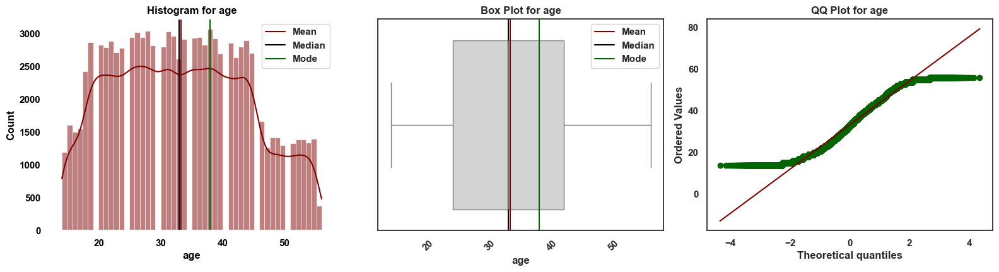



Skew for age is 0.1563
Kurtosis for age is -0.9268




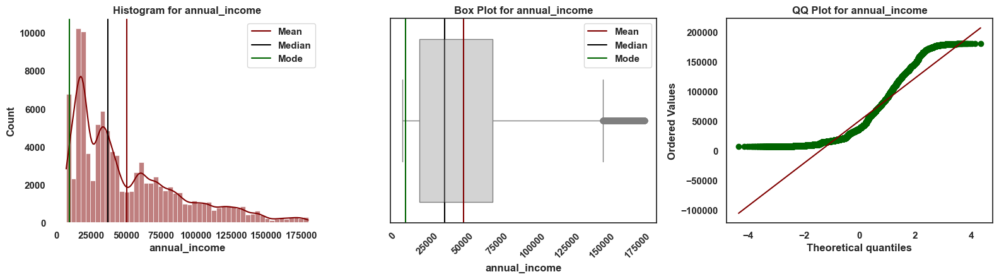



Skew for annual_income is 1.1302
Kurtosis for annual_income is 0.6082




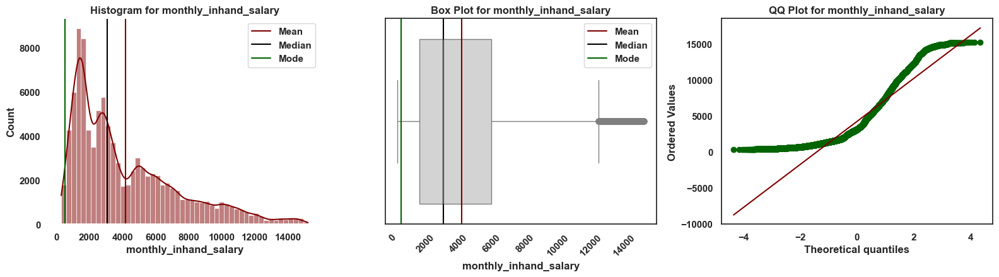



Skew for monthly_inhand_salary is 1.1287
Kurtosis for monthly_inhand_salary is 0.6174




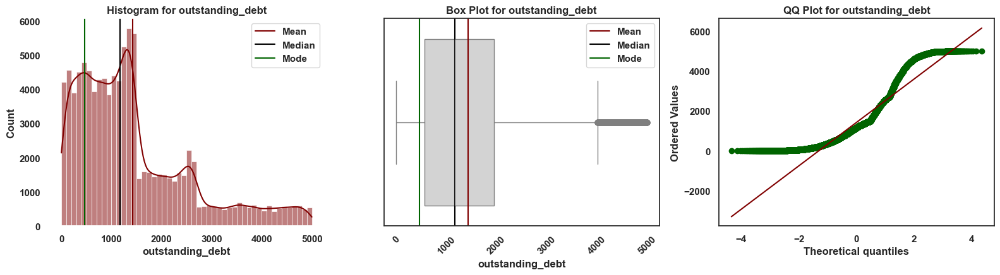



Skew for outstanding_debt is 1.2075
Kurtosis for outstanding_debt is 0.9050




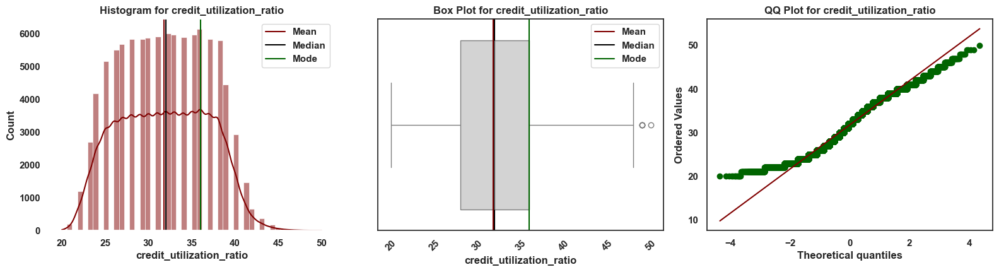



Skew for credit_utilization_ratio is 0.0291
Kurtosis for credit_utilization_ratio is -0.9368




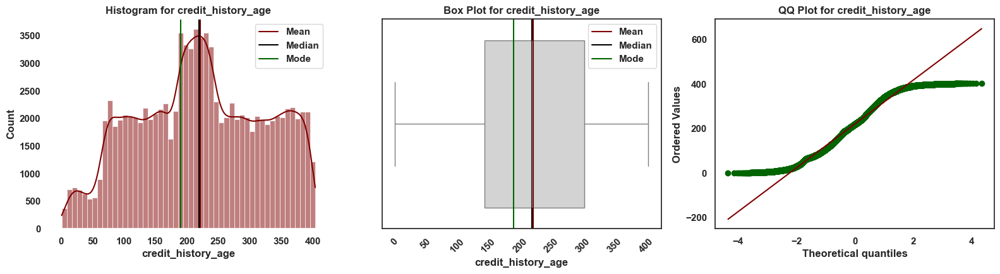



Skew for credit_history_age is -0.0488
Kurtosis for credit_history_age is -0.9022




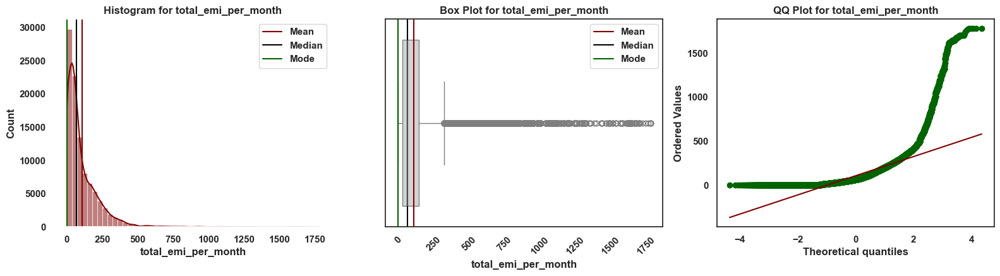



Skew for total_emi_per_month is 4.0415
Kurtosis for total_emi_per_month is 29.7831




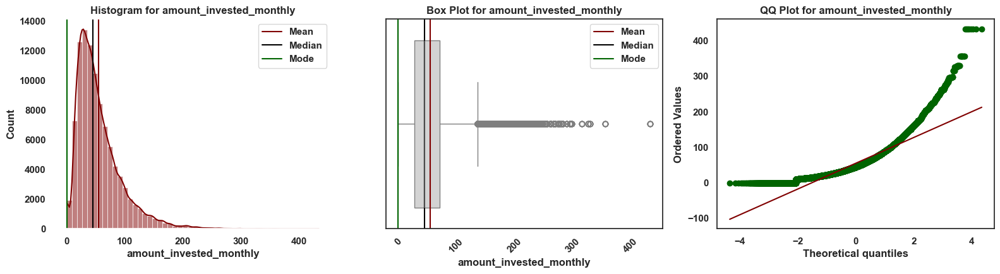



Skew for amount_invested_monthly is 1.7610
Kurtosis for amount_invested_monthly is 5.0253




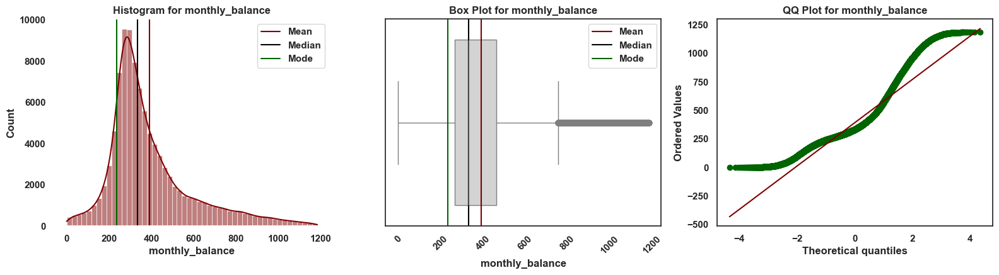



Skew for monthly_balance is 1.3556
Kurtosis for monthly_balance is 1.8883




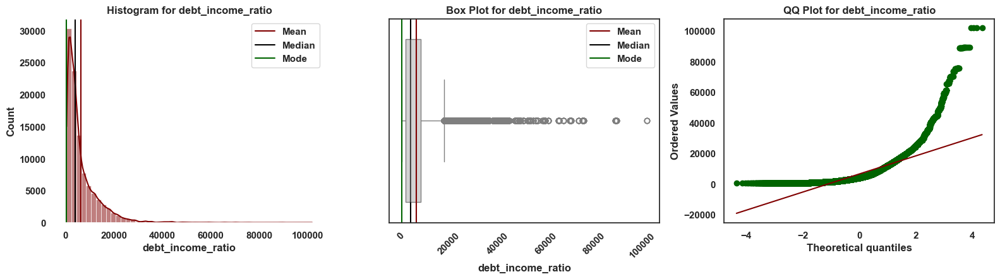



Skew for debt_income_ratio is 3.0382
Kurtosis for debt_income_ratio is 16.8082




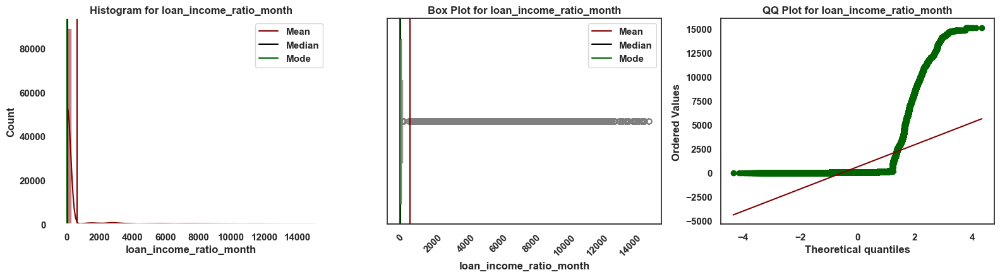



Skew for loan_income_ratio_month is 4.1611
Kurtosis for loan_income_ratio_month is 18.0425




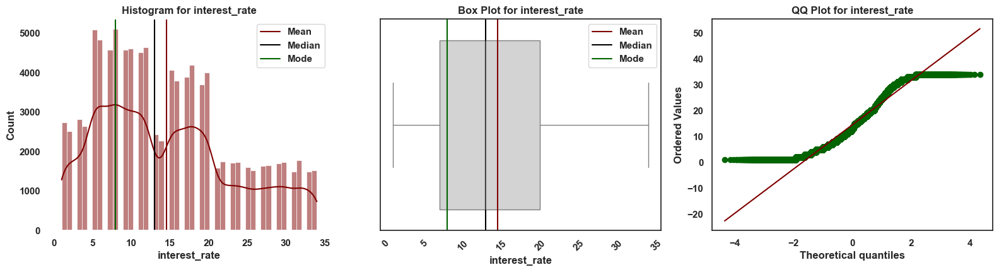



Skew for interest_rate is 0.4962
Kurtosis for interest_rate is -0.6819




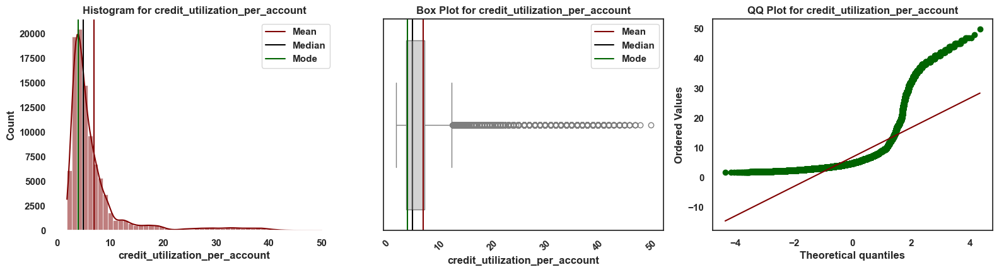



Skew for credit_utilization_per_account is 3.2312
Kurtosis for credit_utilization_per_account is 11.1977




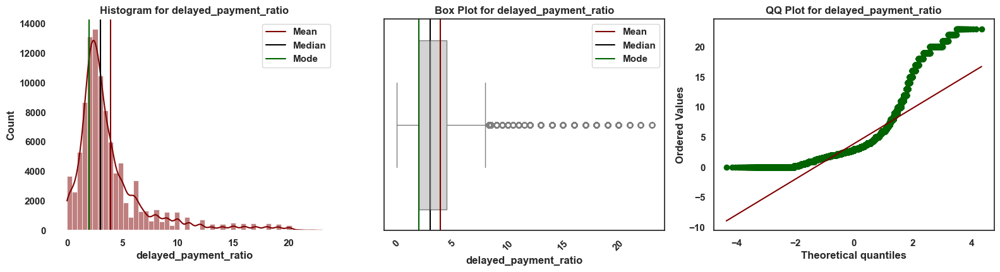



Skew for delayed_payment_ratio is 2.3763
Kurtosis for delayed_payment_ratio is 6.6450




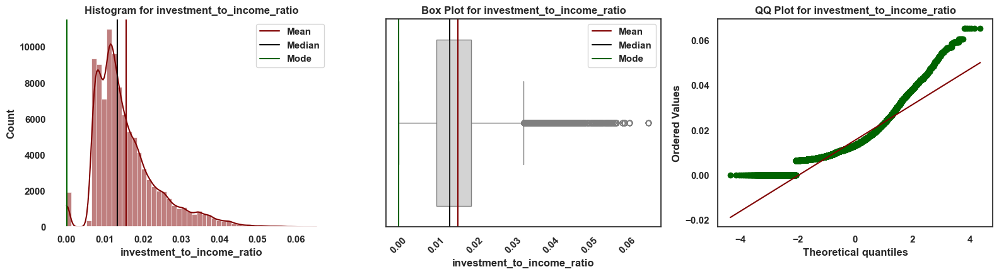



Skew for investment_to_income_ratio is 1.3715
Kurtosis for investment_to_income_ratio is 2.4119




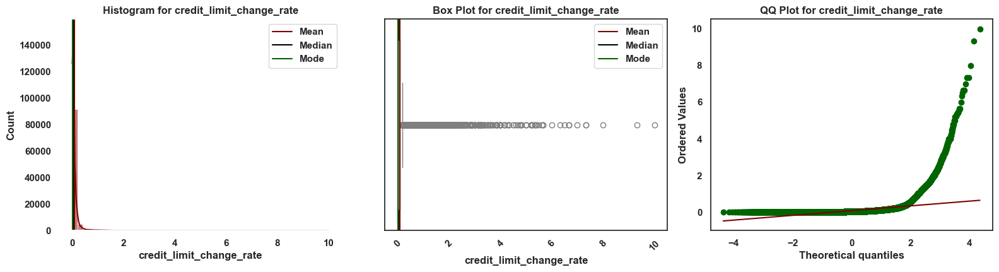



Skew for credit_limit_change_rate is 11.3453
Kurtosis for credit_limit_change_rate is 219.5843




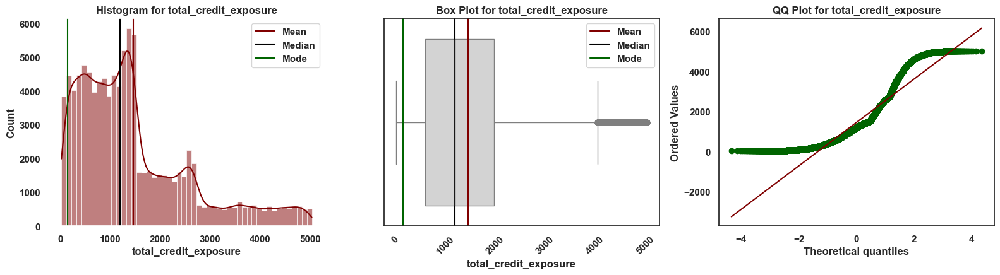



Skew for total_credit_exposure is 1.2078
Kurtosis for total_credit_exposure is 0.9062




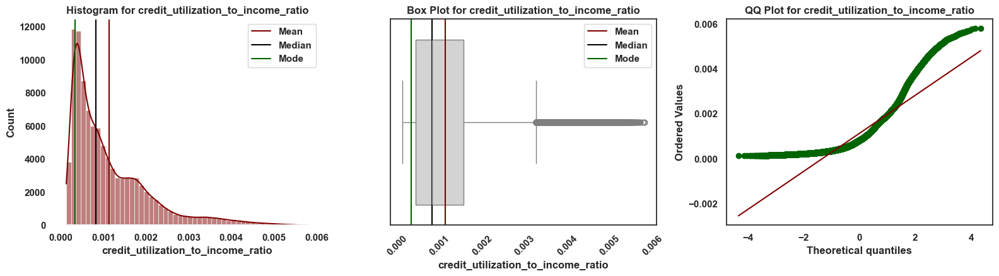



Skew for credit_utilization_to_income_ratio is 1.6149
Kurtosis for credit_utilization_to_income_ratio is 2.7111




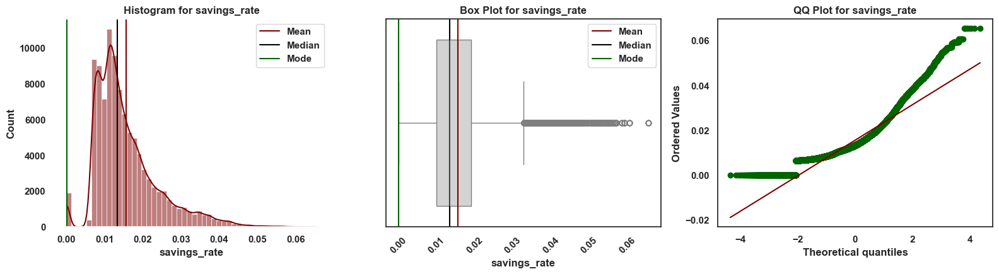



Skew for savings_rate is 1.3725
Kurtosis for savings_rate is 2.4142




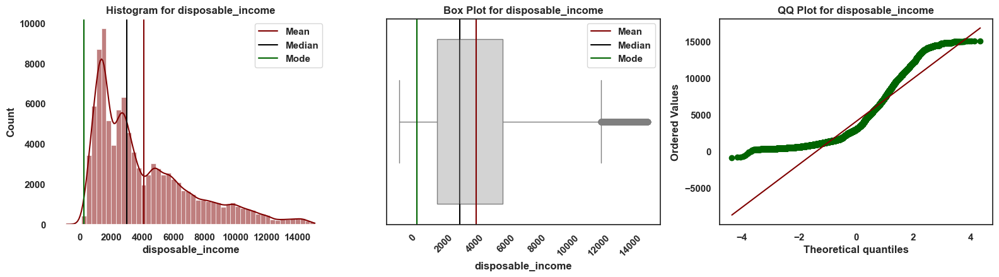



Skew for disposable_income is 1.1504
Kurtosis for disposable_income is 0.6806




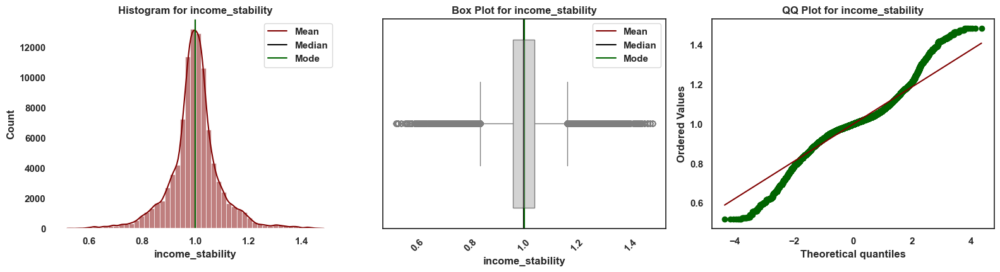



Skew for income_stability is 0.0909
Kurtosis for income_stability is 3.2810




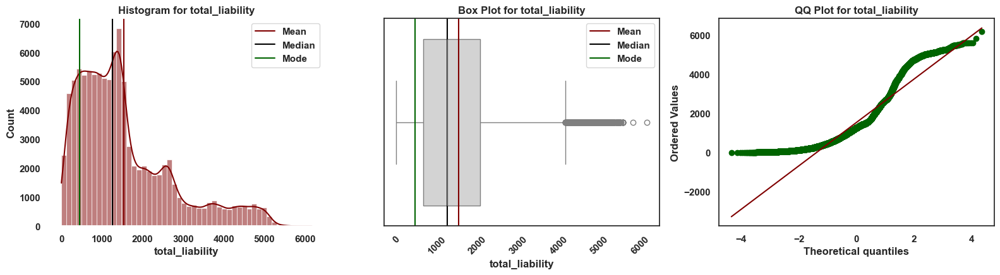



Skew for total_liability is 1.2003
Kurtosis for total_liability is 0.8952




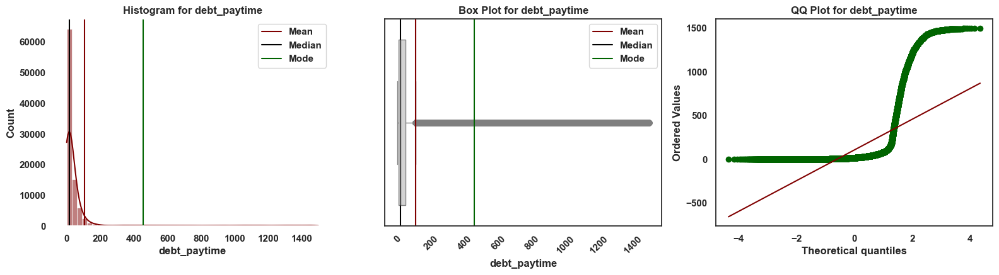



Skew for debt_paytime is 3.4513
Kurtosis for debt_paytime is 11.1968




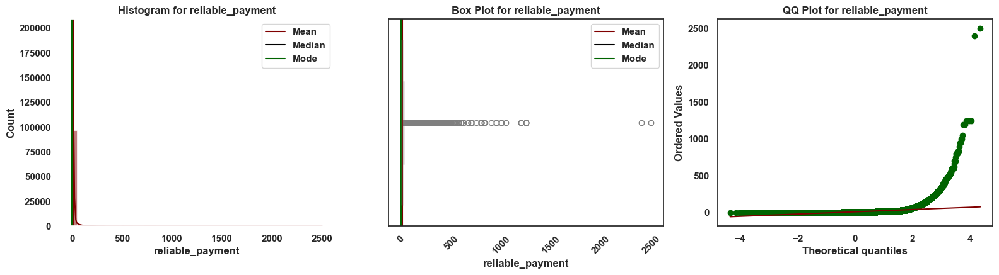



Skew for reliable_payment is 21.7870
Kurtosis for reliable_payment is 1007.5103




In [15]:
skewed_col = []


for i in continuous:
    univar_num(df,i) 
    skew_val = df[i].skew()
    kurt=df[i].kurtosis()
    kurt_color = kurtosis_color(kurt)
    color = skewness_color(skew_val)
    skewed_col.append(i)

    print(f"\n\n{color}Skew for {i} is {skew_val:.4f}{color_neutral}")
    print(f"{color}Kurtosis for {i} is {kurt:.4f}{color_neutral}\n\n")

#### <span style="color:Khaki;"> Observations and insights from plots above:</span>

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Histogram (First Plot) -**</span> A histogram is like a bar chart showing how often different values occur in your data. A smooth line (KDE) estimating the shape of data distribution.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Box-and-Whisker plot, (Second Plot) -**</span> The "box" represents the middle 50% of your data. The line in the middle of the box is the median. The "whiskers" extend to show the rest of the distribution.Points beyond the whiskers are potential outliers.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Q-Q Plot (Quantile-Quantile (Third plot)): -**</span> This plot compares your data's distribution to a theoretical normal distribution. It show how closely your data follows a normal distribution and Where and how your data deviates from normality.
   



   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Observations: -**</span> 
      - All features are right skewed (right tail) except `credit_utilization_ratio`, `credit_history_age`, `interest_rate`,`income_stability`. 
      - Effect of Skewness, we have outliers after the upper whisker (right side of the box plot).
      - Q-Q plot also confirms the same from the data deviation. The red line on the Q-Q plot is therotical line of Normal distribution and the green line is our data distrinbution.
      - All of these explains the presence of larger values but in smaller quantities.

<span style="color: Chartreuse;font-size: 130%">&#9784; &nbsp;</span> <span style="color: Tomato;font-size: 130%"> <b>We will need to use appropriate techniques like normalizing, capping outliers to certain percentile, etc, to address these issues</b></span>

### <span style="color:Khaki;">Statistival Test for Normality, Skew, Kurtosis:

Performing statustival test to confirm

In [16]:
for var in continuous:
    stat, p = kstest(df[var], 'norm', args=(df[var].mean(), df[var].std()))
    print(f'K-S Test for {var}: Statistics={stat}, p={p}')
    if p > 0.05:
        print(f'{var} looks normally distributed.\n')
    else:
        print(f'{var} does not look normally distributed.\n')


K-S Test for age: Statistics=0.06333800275302293, p=0.0
age does not look normally distributed.

K-S Test for annual_income: Statistics=0.14203315204670652, p=0.0
annual_income does not look normally distributed.

K-S Test for monthly_inhand_salary: Statistics=0.14067914495519357, p=0.0
monthly_inhand_salary does not look normally distributed.

K-S Test for outstanding_debt: Statistics=0.1576940779266306, p=0.0
outstanding_debt does not look normally distributed.

K-S Test for credit_utilization_ratio: Statistics=0.07522803037797016, p=0.0
credit_utilization_ratio does not look normally distributed.

K-S Test for credit_history_age: Statistics=0.04701729085776474, p=1.5166792217978926e-192
credit_history_age does not look normally distributed.

K-S Test for total_emi_per_month: Statistics=0.20774923359207237, p=0.0
total_emi_per_month does not look normally distributed.

K-S Test for amount_invested_monthly: Statistics=0.11635316180823785, p=0.0
amount_invested_monthly does not look no

In [17]:
for var in continuous:
    skewness = skew(df[var])
    kurt = kurtosis(df[var])
    print(f'{var} - Skewness: {skewness}, Kurtosis: {kurt}')
    if abs(skewness) < 0.5 and abs(kurt) < 3:
        print(f'{var} looks normally distributed.\n')
    else:
        print(f'{var} does not look normally distributed.\n')

age - Skewness: 0.15633520591857253, Kurtosis: -0.9268249487967637
age looks normally distributed.

annual_income - Skewness: 1.1302056133322436, Kurtosis: 0.6080616287066642
annual_income does not look normally distributed.

monthly_inhand_salary - Skewness: 1.1286726799893096, Kurtosis: 0.6172697245812087
monthly_inhand_salary does not look normally distributed.

outstanding_debt - Skewness: 1.2075180824515632, Kurtosis: 0.9048784417856148
outstanding_debt does not look normally distributed.

credit_utilization_ratio - Skewness: 0.02908361356871466, Kurtosis: -0.93682415510728
credit_utilization_ratio looks normally distributed.

credit_history_age - Skewness: -0.04883093164669138, Kurtosis: -0.9021892367398672
credit_history_age looks normally distributed.

total_emi_per_month - Skewness: 4.04143162144064, Kurtosis: 29.781598859016853
total_emi_per_month does not look normally distributed.

amount_invested_monthly - Skewness: 1.761009815009086, Kurtosis: 5.024956143518471
amount_inv

<span style="color: Chartreuse;font-size: 130%">&#9784; &nbsp;</span> <span style="color: Tomato;font-size: 130%"> <b>Above are the another way of checking distribution and Skewness, it representing the same results as plots.</b></span>

### <span style="color:Khaki;">Categorical features Distribution

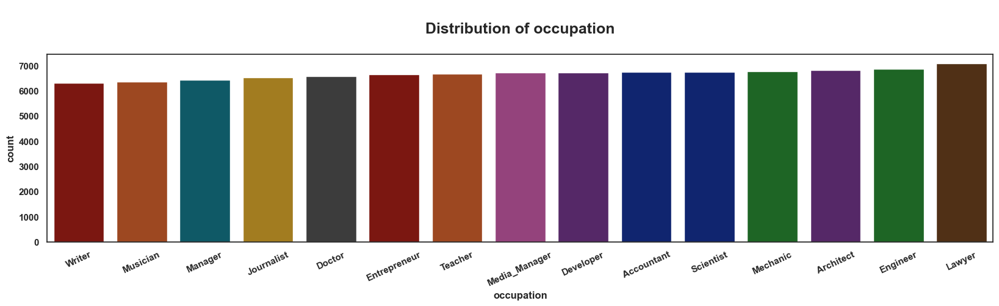

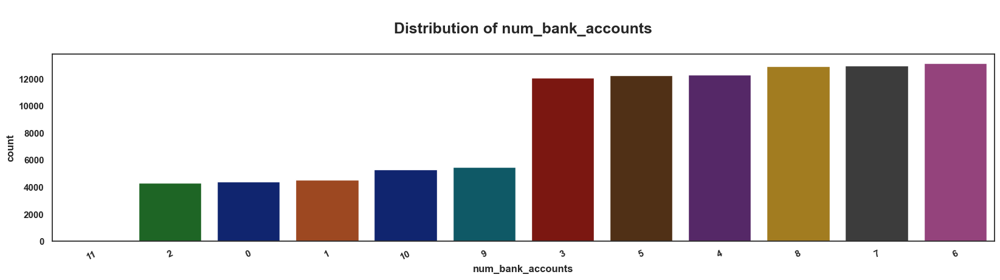

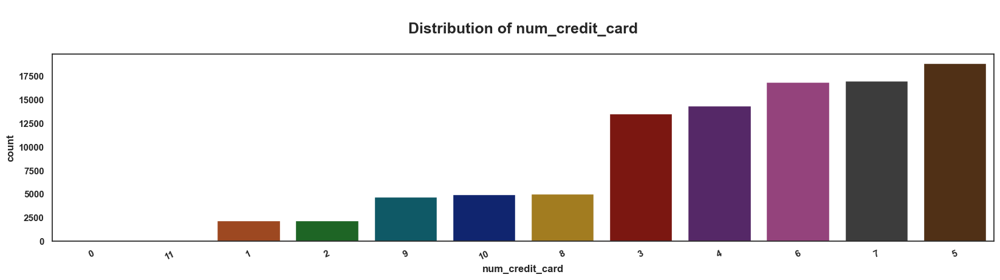

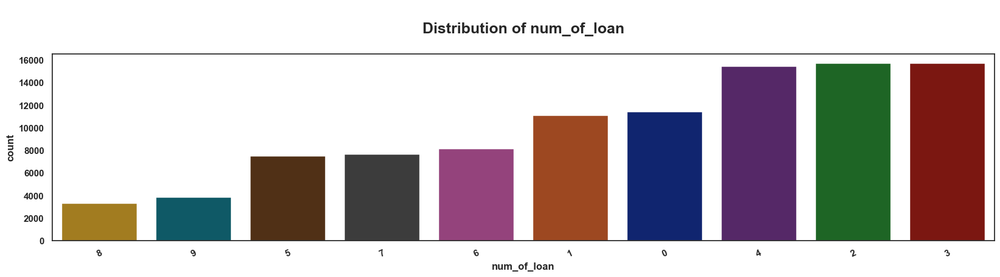

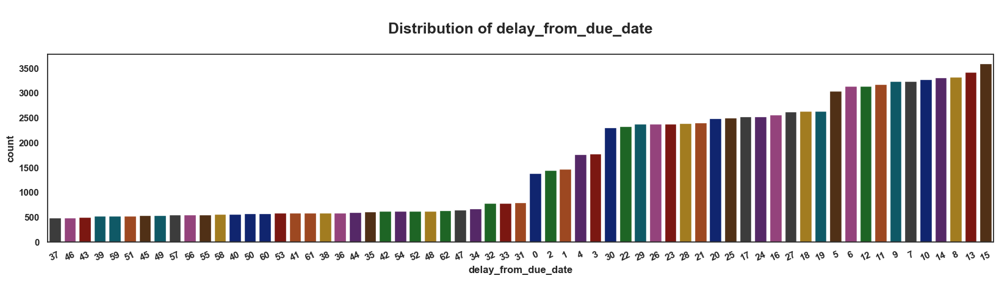

...

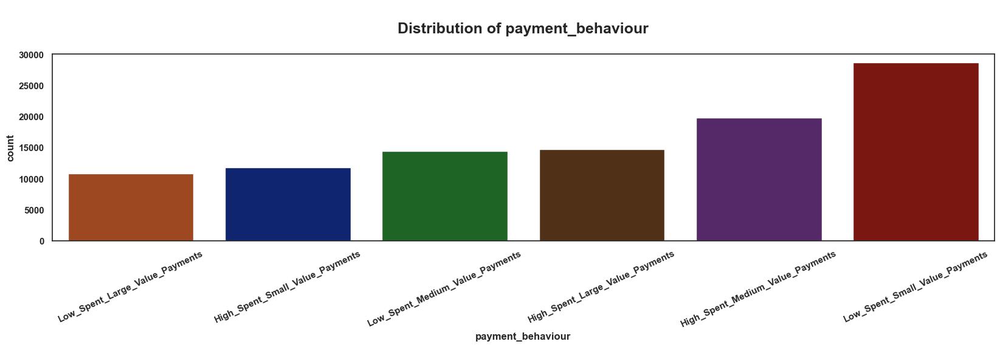

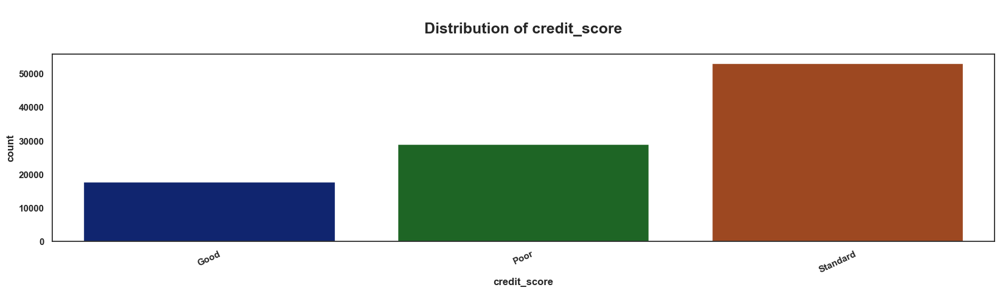

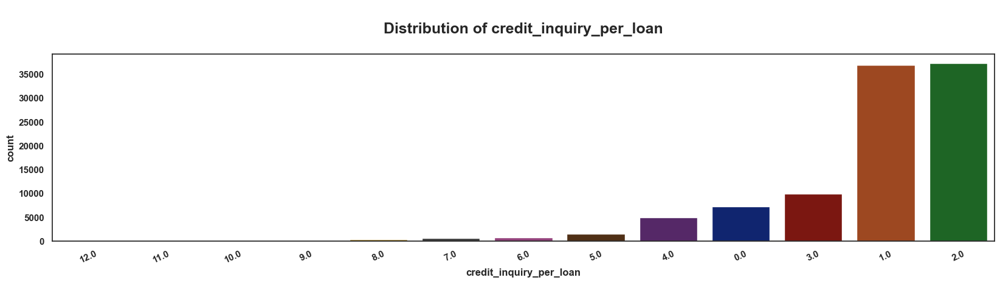

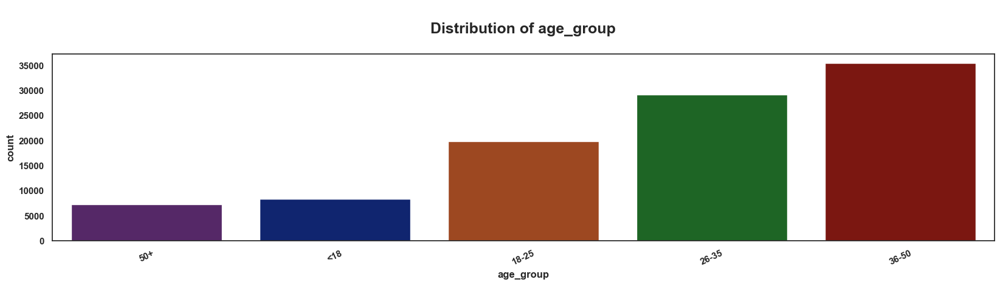

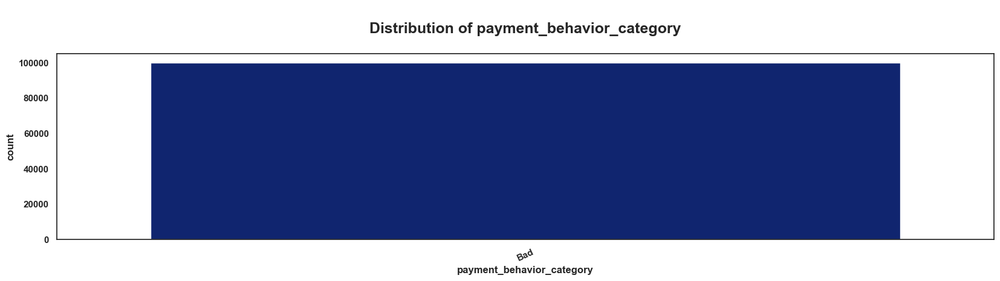

In [18]:
for i in categorical:
    plt.figure(figsize=(20, 4))
    sns.countplot(data=df, x=df[i], hue=i, order = df[i].value_counts().index.tolist()[::-1],palette='dark',legend=False)
    plt.title(f"\nDistribution of {i}\n",fontdict={'fontsize':18,'fontweight':'bold'})
    plt.xticks(rotation=25)
plt.show()

#### <span style="color:Khaki;"> Insights from Categorical Variables distribution:</span>

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Bank Accounts: -**</span>  Most people have 3 to 9 bank accounts.

   - <span style="color: Tomato;font-fa mily:calibri;font-size:130%">**Credit Cards: -**</span> Most people have 3 to 8 credit cards.
   
   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Loans -**</span> Most people have 2 to 4 loans.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Payment Behavior: -**</span> Most people pay the minimum due. This group is a key target for our problem statement (target people for the bank).

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Credit Scores: -**</span> Most people have a standard credit score, likely those who pay only the minimum dues.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Loan Enquiries: -**</span> The largest audience consists of people with low loan enquiries.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Age Distribution: -**</span> Most of the audience is aged between 36 and 50. There is a non-linear relationship observed, with minimal representation from those below 18 and above 50. The mid-age group constitutes the majority.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Payment Behaviour: -**</span> it has only one category so we can drop this column.

### <span style="color:Khaki;"> Relationship Categorical Variables VS Credit Score:</span>

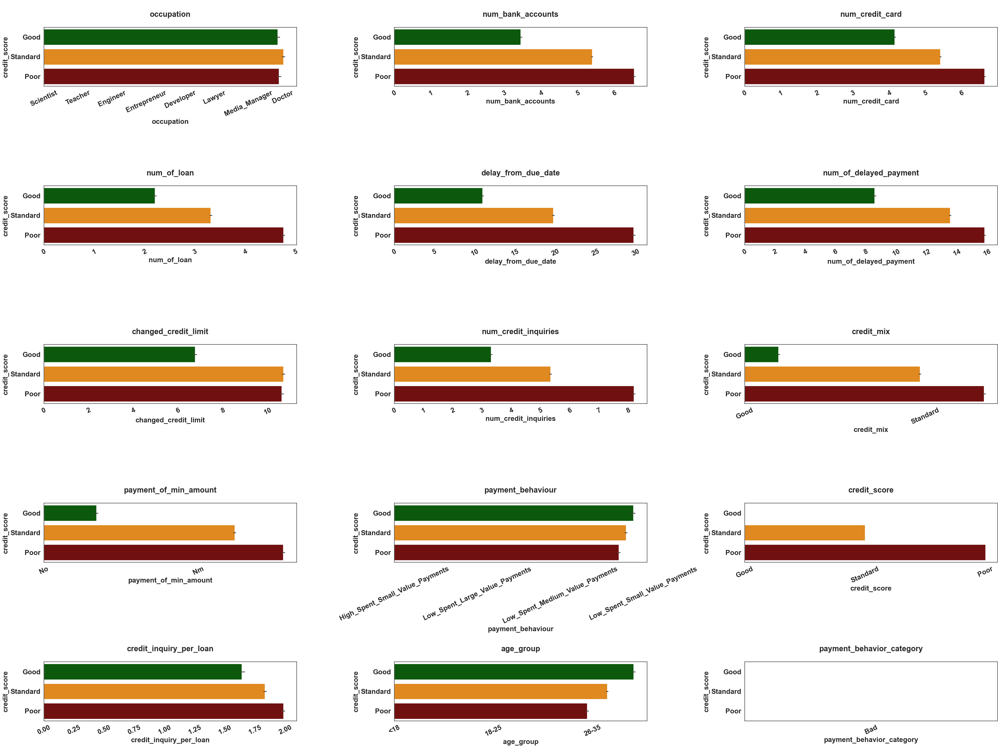

In [19]:
fig, axes = plt.subplots(ncols=3, nrows = int(np.ceil(len(categorical)/3)), figsize=(40, 30))

for i, col in enumerate(categorical):
    if i != 'credit_score':
        sns.barplot(data=df, x=col, y='credit_score', hue="credit_score",hue_order=['Good','Standard','Poor'],orient='h',palette=['DarkGreen','darkorange','maroon'], legend=False,ax=axes[i//3, i%3])
        axes[i//3, i%3].set_title(f"\n{col}\n", weight='bold', fontsize=22)  # Explicitly set title font weight and size
        axes[i//3, i%3].tick_params(axis='x', rotation=25, labelsize=20)  # Set xtick label size
        axes[i//3, i%3].tick_params(axis='y', labelsize=20)  # Set ytick label size
        axes[i//3, i%3].set_xlabel(col, fontsize=20, weight='bold')  # Set xlabel size and weight
        axes[i//3, i%3].set_ylabel('credit_score', fontsize=20, weight='bold')  # Set ylabel size and weight
    
plt.tight_layout()
plt.show()

#### <span style="color:Khaki;"> Insights from Categorical Variables in relation with Credit Score:</span>

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Occupation: -**</span>  There is no relationship between occupation and credit score.

   - <span style="color: Tomato;font-fa mily:calibri;font-size:130%">**No of Bank Account: -**</span> Individuals with more bank accounts tend to have poorer credit scores, while those with fewer bank accounts tend to have better credit scores.
   
   - <span style="color: Tomato;font-family:calibri;font-size:130%">**No of Credit Card -**</span> Individuals with more credit cards tend to have poorer credit scores, while those with fewer credit cards tend to have better credit scores.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Payment Behavior: -**</span> Individuals who frequently make delayed payments tend to have poorer credit scores, while those who pay dues on time tend to have better credit scores. Individuals who consistently pay the minimum due on their credit accounts tend to have better credit scores, while those who do not tend to have poorer credit scores.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**No of Loans: -**</span> Individuals with fewer loans tend to have better credit scores, while those with more loans tend to have poorer credit scores.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Loan Enquiries: -**</span> Individuals who make more credit inquiries tend to have poorer credit scores, while those who make fewer credit inquiries tend to have better credit scores.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Age: -**</span> As age increases, credit scores tend to increase as well.
   
   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Credit Limit Changes: -**</span> Individuals who frequently change their credit limits tend to have poorer credit scores, while those who do not change their limits frequently tend to have better credit scores.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Credit Mix: -**</span> Individuals with less diverse credit mixes tend to have better credit scores, while those with more diverse credit mixes tend to have higher credit scores.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Credit Mix: -**</span> Individuals with less diverse credit mixes tend to have better credit scores, while those with more diverse credit mixes tend to have higher credit scores.

### <span style="color:Khaki;"> Relationship Numerical Variables VS Credit Score:</span>

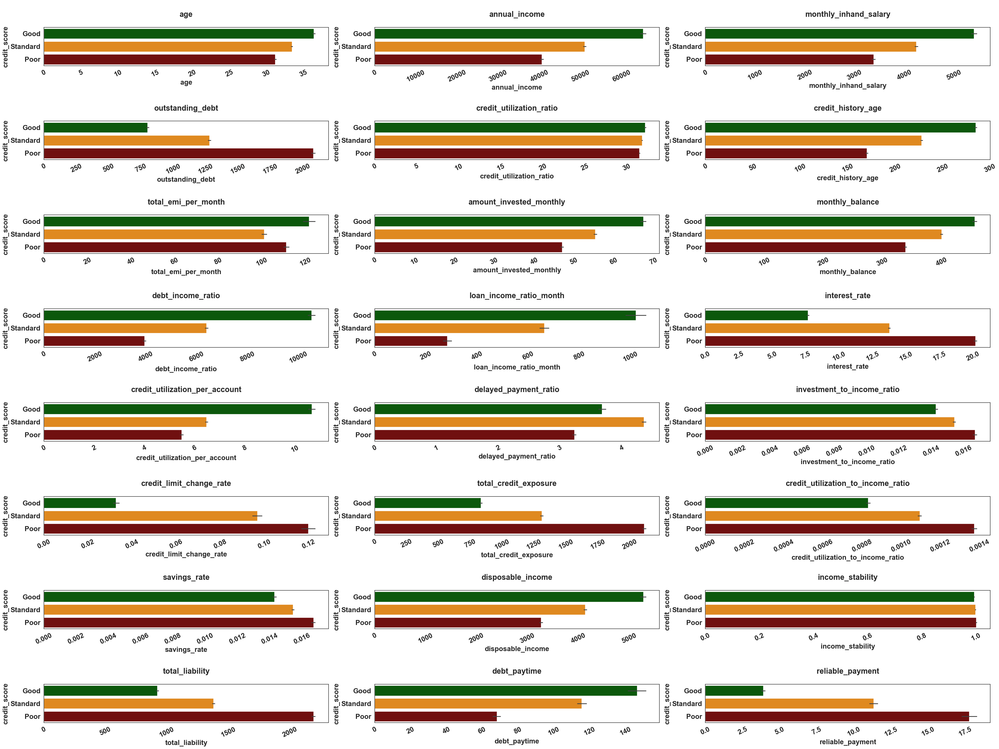

In [20]:
fig, axes = plt.subplots(ncols=3, nrows = int(np.ceil(len(continuous)/3)), figsize=(40, 30))


for i, col in enumerate(continuous):
    if i != 'credit_score':
        sns.barplot(data=df, x=col, y='credit_score', hue="credit_score",hue_order=['Good','Standard','Poor'],orient='h',palette=['DarkGreen','darkorange','maroon'], legend=False,ax=axes[i//3, i%3])
        axes[i//3, i%3].set_title(col,fontdict={'fontsize':20,'fontweight':'bold'})
        axes[i//3, i%3].tick_params(axis='x', rotation=25)
        axes[i//3, i%3].set_title(f"\n{col}\n", weight='bold', fontsize=22)  # Explicitly set title font weight and size
        axes[i//3, i%3].tick_params(axis='x', rotation=25, labelsize=20)  # Set xtick label size
        axes[i//3, i%3].tick_params(axis='y', labelsize=20)  # Set ytick label size
        axes[i//3, i%3].set_xlabel(col, fontsize=20, weight='bold')  # Set xlabel size and weight
        axes[i//3, i%3].set_ylabel('credit_score', fontsize=20, weight='bold')  # Set ylabel size and weight
    
plt.tight_layout()
plt.show()

#### <span style="color:Khaki;"> Insights from Continuous Variables in relation with Credit Score:</span>

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Income: -**</span>  Higher income is generally associated with better credit scores, while lower income tends to be associated with poorer credit scores.

   - <span style="color: Tomato;font-fa mily:calibri;font-size:130%">**Outstanding Debt: -**</span> Individuals with lower outstanding debt typically have better credit scores compared to those with higher outstanding debt.
   
   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Credit Utilization -**</span> Higher credit utilization is generally linked to higher credit scores, while lower credit utilization tends to be associated with lower credit scores.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Credit History: -**</span> A longer credit history is often associated with better credit scores, while a shorter credit history tends to be associated with poorer credit scores.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Total EMI per Month: -**</span> The relationship between total EMI per month and credit score seems complex and might be influenced by income level. Higher EMIs are not necessarily indicative of better or worse credit scores.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Investment: -**</span> Individuals with higher investment amounts tend to have better credit scores compared to those with lower investment amounts.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Monthly Balance: -**</span> Maintaining a higher monthly balance is generally associated with better credit scores, while lower balances tend to be associated with poorer credit scores.
   
   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Credit Utilization Ratio: -**</span> This seems to have a strong positive correlation with credit score.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Debt Income Ratio: -**</span> A lower debt-to-income ratio is generally associated with better credit scores.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Loan Income Ratio: -**</span> A lower loan-to-income ratio is generally associated with better credit scores.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Interest Rate: -**</span>  While the relationship is less clear, there might be a slight tendency for lower interest rates to be associated with better credit scores.

   - <span style="color: Tomato;font-fa mily:calibri;font-size:130%">**Delayed Payment Ratio: -**</span> This seems to have a strong negative correlation with credit score.
   
   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Investment to Income Ratio -**</span> A higher investment-to-income ratio is generally associated with better credit scores.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Credit Utilization to Income Ratio: -**</span> A lower credit utilization-to-income ratio is generally associated with better credit scores.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Savings Rate: -**</span> A higher savings rate is generally associated with better credit scores.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Disposable Income: -**</span> A higher disposable income is generally associated with better credit scores.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Debt Paytime: -**</span> A shorter debt pay time is generally associated with better credit scores.
   
   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Reliable Payment: -**</span> A higher reliable payment score is generally associated with better credit scores.

### <span style="color:Khaki;"> Credit Scores Based on Annual Income:</span>

Text(0.5, 1.0, 'Credit Scores Based on Annual Income')

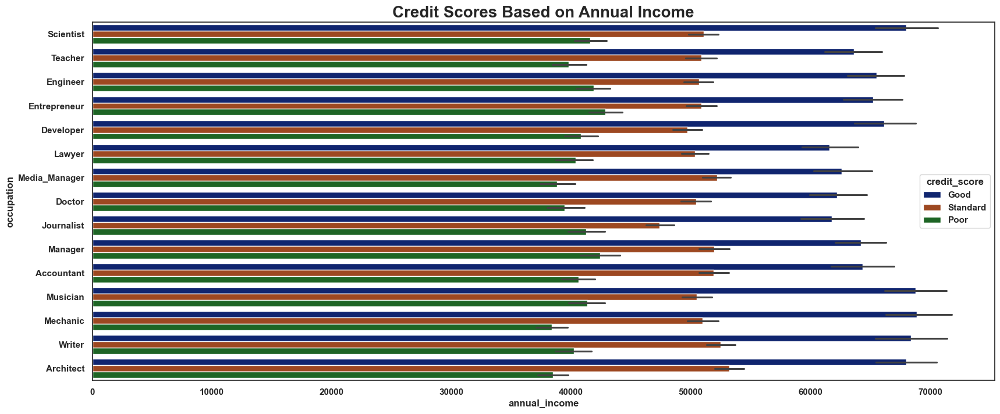

In [21]:
plt.figure(figsize=(20,8))
sns.barplot(data=df,x='annual_income', y='occupation',hue='credit_score',palette='dark')
plt.title("Credit Scores Based on Annual Income",fontdict={'fontsize':20,'fontweight':'bold'})

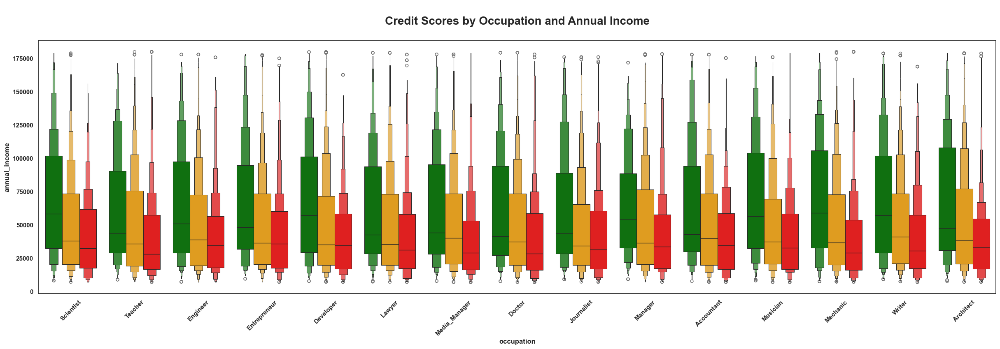

In [22]:
plt.figure(figsize=(30, 8))
sns.boxenplot(x="occupation", y="annual_income", hue="credit_score", hue_order= ['Good','Standard','Poor'],palette=['green','orange','red'],data=df,legend=False)
plt.title("\nCredit Scores by Occupation and Annual Income\n",fontdict={'fontsize':20,'fontweight':'bold'})
plt.xticks(rotation=45)
plt.show()

### <span style="color:Khaki;">Pair Plot</span>

<Figure size 2000x3000 with 0 Axes>

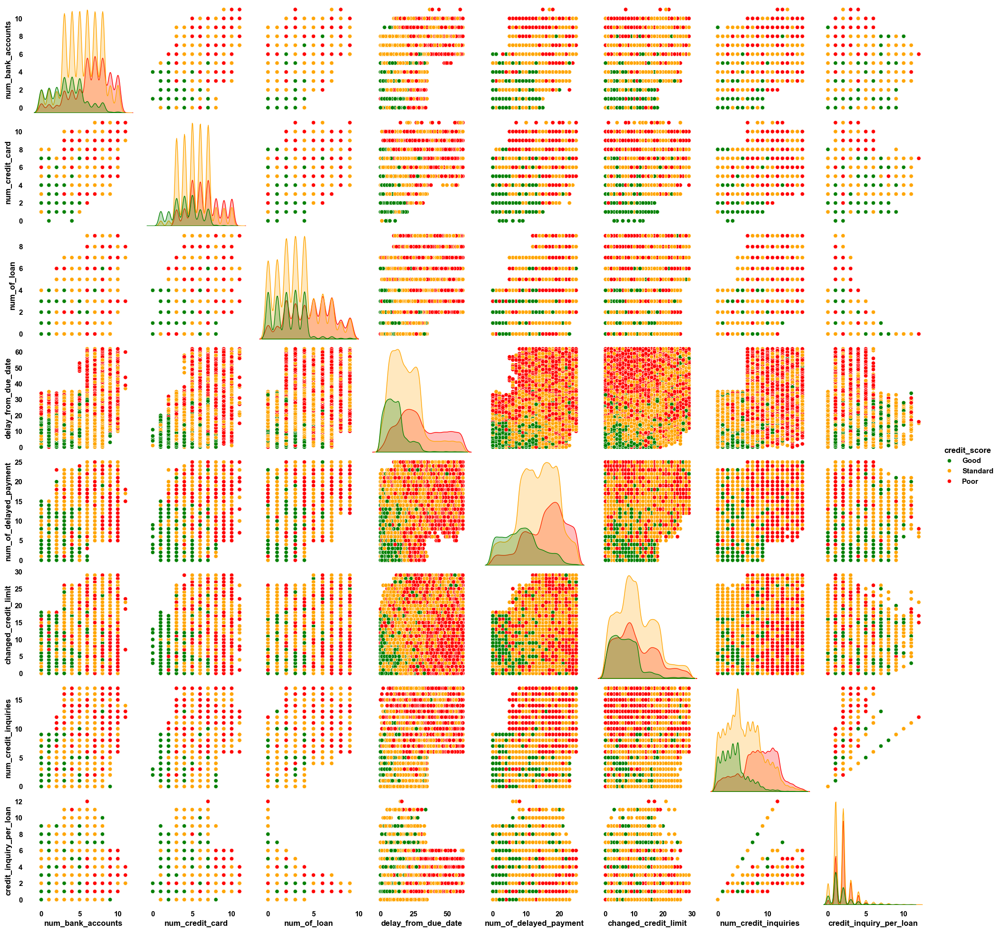

In [38]:
plt.figure(figsize=(20,30))
sns.pairplot(data=df[categorical] , hue = 'credit_score',hue_order= ['Good','Standard','Poor'],palette=['green','orange','red'])
plt.show()

<Figure size 2000x3000 with 0 Axes>

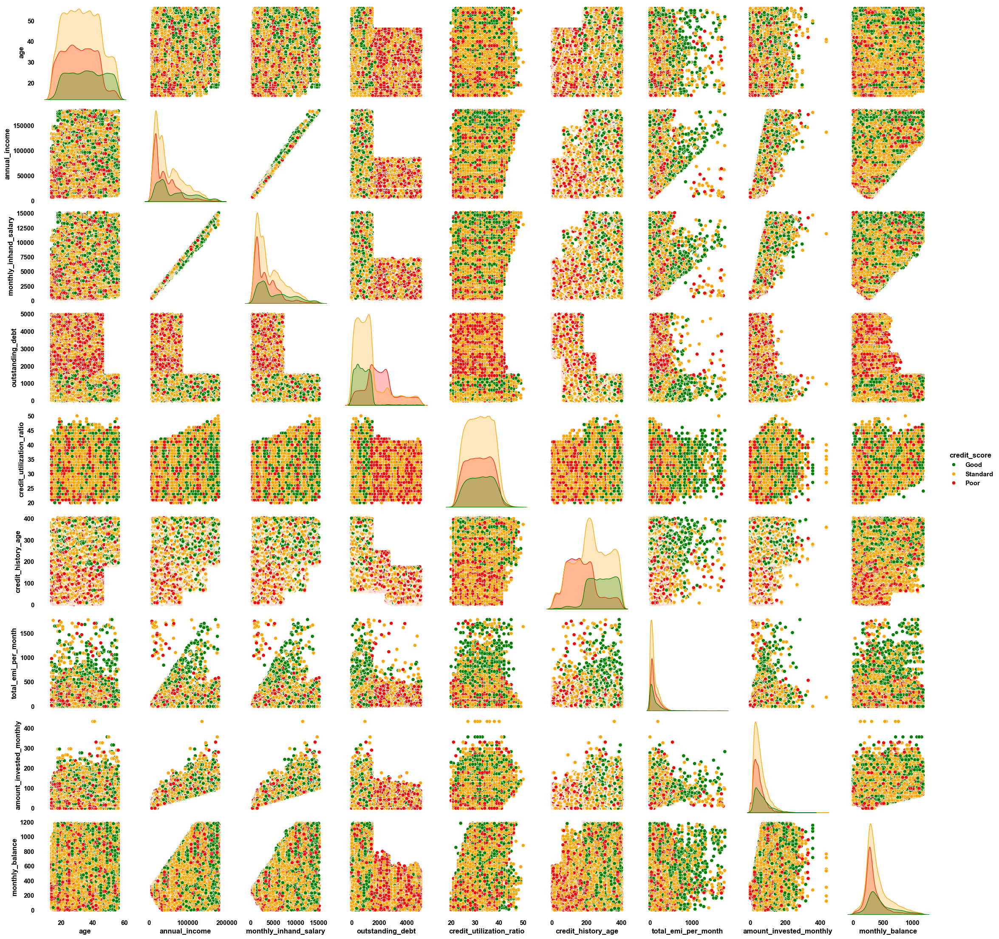

In [11]:
df_pair =df[['age','annual_income', 'monthly_inhand_salary','outstanding_debt',
       'credit_utilization_ratio', 'credit_history_age',
       'payment_of_min_amount', 'total_emi_per_month',
       'amount_invested_monthly','monthly_balance',
       'credit_score']]

continuous.append('credit_score') 
plt.figure(figsize=(20,30))
sns.pairplot(data=df_pair , hue = 'credit_score',hue_order= ['Good','Standard','Poor'],palette=['green','orange','red'])
plt.show()
continuous.remove('credit_score') 

### <p Style="color: Khaki">Correlation - Pearson's and Spearman's </p>

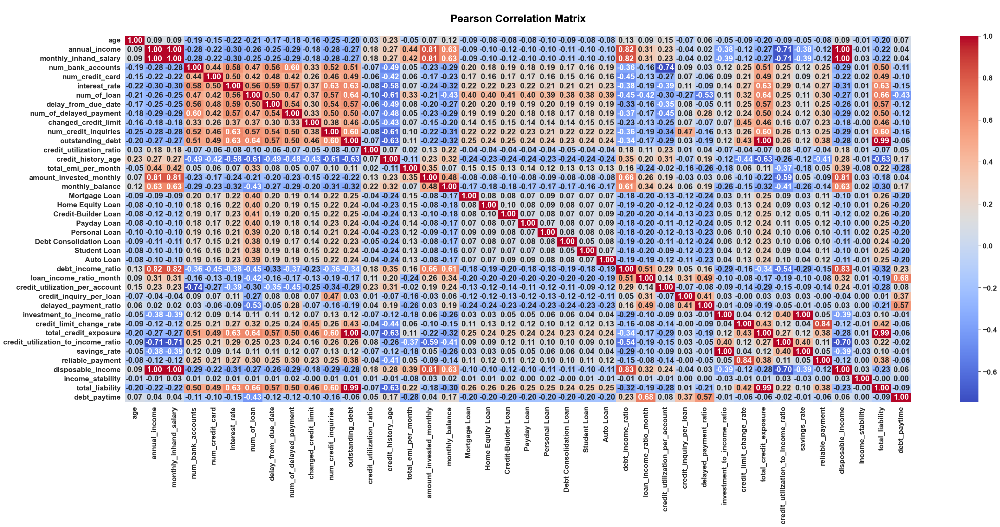

In [23]:
sns.set_theme(font_scale=1.5)

cor_col = df.select_dtypes(include='number')
correlation_matrix_pear = cor_col.corr()
plt.figure(figsize=(40,15))

sns.heatmap(correlation_matrix_pear,annot=True,fmt='.2f',cmap='coolwarm')
plt.title('\nPearson Correlation Matrix\n',fontdict={'fontsize':24,'color':'black','fontweight':'bold'})
plt.show()

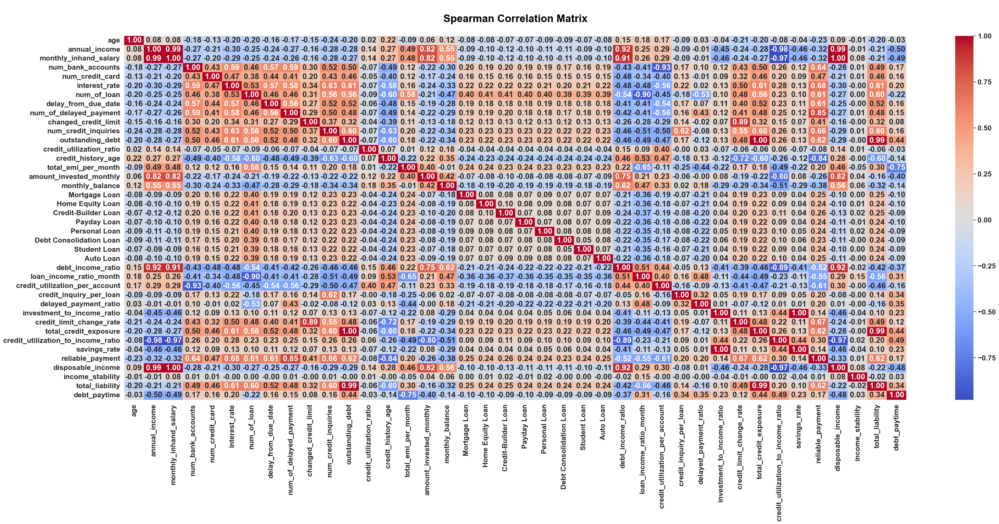

In [24]:
plt.figure(figsize=(40,15))

cor_col = df.select_dtypes(include='number')
correlation_matrix = cor_col.corr(method='spearman')
sns.heatmap(correlation_matrix,annot=True,fmt='.2f',cmap='coolwarm')
plt.title('\nSpearman Correlation Matrix\n',fontdict={'fontsize':24,'color':'black','fontweight':'bold'})

plt.show()

### <p Style="color: Khaki">Checking data type before exporting dataset </p>

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 46 columns):
 #   Column                              Non-Null Count   Dtype   
---  ------                              --------------   -----   
 0   age                                 100000 non-null  int8    
 1   occupation                          100000 non-null  object  
 2   annual_income                       100000 non-null  float64 
 3   monthly_inhand_salary               100000 non-null  float64 
 4   num_bank_accounts                   100000 non-null  int8    
 5   num_credit_card                     100000 non-null  int8    
 6   interest_rate                       100000 non-null  int8    
 7   num_of_loan                         100000 non-null  int8    
 8   delay_from_due_date                 100000 non-null  int8    
 9   num_of_delayed_payment              100000 non-null  int8    
 10  changed_credit_limit                100000 non-null  int8    
 11  num_credit_inq

In [25]:
df.sample(3)

,age,occupation,annual_income,monthly_inhand_salary,num_bank_accounts,num_credit_card,interest_rate,num_of_loan,delay_from_due_date,num_of_delayed_payment,changed_credit_limit,num_credit_inquiries,credit_mix,outstanding_debt,credit_utilization_ratio,credit_history_age,payment_of_min_amount,total_emi_per_month,amount_invested_monthly,payment_behaviour,monthly_balance,credit_score,Auto Loan,Credit-Builder Loan,Debt Consolidation Loan,Payday Loan,Home Equity Loan,Personal Loan,Mortgage Loan,Student Loan,debt_income_ratio,loan_income_ratio_month,credit_utilization_per_account,credit_inquiry_per_loan,age_group,delayed_payment_ratio,investment_to_income_ratio,credit_limit_change_rate,payment_behavior_category,total_credit_exposure,credit_utilization_to_income_ratio,savings_rate,reliable_payment,income_stability,total_liability,debt_paytime
12426,25,Architect,93561.7200,7547.8100,4,4,12,4,29,16,11,7.0000,Standard,469.4300,35,378,Yes,215.3537,53.3402,High_Spent_Large_Value_Payments,726.0871,Standard,0,0,0,1,0,1,1,0,11695.2150,35.0484,8.7500,2.0000,18-25,4.0000,0.0071,0.0291,Bad,504.4300,0.0004,0.0071,4.2328,0.9681,684.7837,2.1798
60271,44,Scientist,30174.0300,2409.2969,3,2,10,2,1,14,11,6.0000,Good,57.5100,33,359,No,282.2728,28.3969,High_Spent_Small_Value_Payments,397.1155,Good,0,1,0,0,0,0,0,1,7543.5075,8.5353,11.0000,3.0000,36-50,7.0000,0.0118,0.0306,Bad,90.5100,0.0011,0.0118,3.8997,0.9582,339.7828,0.2037
80122,30,Engineer,35320.9900,2867.4158,0,2,2,0,12,8,5,3.0000,Good,905.6200,36,313,No,0.0000,27.5233,Low_Spent_Small_Value_Payments,470.5443,Good,0,0,0,0,0,0,0,0,17660.4950,12913692878516258816.0000,162129586585337856.0000,13510798882111488.0000,26-35,inf,0.0096,0.0160,Bad,941.6200,0.0010,0.0096,2.5559,0.9742,905.6200,4078549894539268608.0000


In [26]:
df['occupation'] = df['occupation'].astype('category')
df['credit_mix'] = df['credit_mix'].astype('category')
df['payment_of_min_amount'] = df['payment_of_min_amount'].astype('category')
df['payment_behaviour'] = df['payment_behaviour'].astype('category')
df['credit_score'] = df['credit_score'].astype('category')
df['payment_behavior_category'] = df['payment_behavior_category'].astype('category')

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 46 columns):
 #   Column                              Non-Null Count   Dtype   
---  ------                              --------------   -----   
 0   age                                 100000 non-null  int8    
 1   occupation                          100000 non-null  category
 2   annual_income                       100000 non-null  float64 
 3   monthly_inhand_salary               100000 non-null  float64 
 4   num_bank_accounts                   100000 non-null  int8    
 5   num_credit_card                     100000 non-null  int8    
 6   interest_rate                       100000 non-null  int8    
 7   num_of_loan                         100000 non-null  int8    
 8   delay_from_due_date                 100000 non-null  int8    
 9   num_of_delayed_payment              100000 non-null  int8    
 10  changed_credit_limit                100000 non-null  int8    
 11  num_credit_inq

In [28]:
df.drop('payment_behavior_category',axis=1,inplace=True)
df.to_feather('feature_engineerd_data')

In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 45 columns):
 #   Column                              Non-Null Count   Dtype   
---  ------                              --------------   -----   
 0   age                                 100000 non-null  int8    
 1   occupation                          100000 non-null  category
 2   annual_income                       100000 non-null  float64 
 3   monthly_inhand_salary               100000 non-null  float64 
 4   num_bank_accounts                   100000 non-null  int8    
 5   num_credit_card                     100000 non-null  int8    
 6   interest_rate                       100000 non-null  int8    
 7   num_of_loan                         100000 non-null  int8    
 8   delay_from_due_date                 100000 non-null  int8    
 9   num_of_delayed_payment              100000 non-null  int8    
 10  changed_credit_limit                100000 non-null  int8    
 11  num_credit_inq